<div style="border-radius:10px;
            border : #015a2c solid;
            background-color:#ecfff5;
           font-size:110%;
           letter-spacing:0.5px;
            text-align: center">

<center><h1 style="padding: 25px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
📉 Hourly Energy Consumption 📈</h1></center>
<center><h3 style="padding-bottom: 25px; color:#015a2c; font-weight: bold; font-style:italic; font-family: Cursive">
(American Electric Power (AEP),<br><br> With Plotly for EDA and Prophet for modeling)</h3></center>     

</div>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hourly-energy-consumption/est_hourly.paruqet
/kaggle/input/hourly-energy-consumption/DOM_hourly.csv
/kaggle/input/hourly-energy-consumption/EKPC_hourly.csv
/kaggle/input/hourly-energy-consumption/DUQ_hourly.csv
/kaggle/input/hourly-energy-consumption/DAYTON_hourly.csv
/kaggle/input/hourly-energy-consumption/PJME_hourly.csv
/kaggle/input/hourly-energy-consumption/PJM_Load_hourly.csv
/kaggle/input/hourly-energy-consumption/NI_hourly.csv
/kaggle/input/hourly-energy-consumption/FE_hourly.csv
/kaggle/input/hourly-energy-consumption/COMED_hourly.csv
/kaggle/input/hourly-energy-consumption/AEP_hourly.csv
/kaggle/input/hourly-energy-consumption/pjm_hourly_est.csv
/kaggle/input/hourly-energy-consumption/DEOK_hourly.csv
/kaggle/input/hourly-energy-consumption/PJMW_hourly.csv


# Import Libraries

In [2]:
import pandas as pd
import math
import numpy as np

# ---------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import pylab 
plt.rcParams['figure.figsize']=(17,5)

# ---------------------------------------
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot

# ---------------------------------------
from fbprophet import Prophet
import holidays
from sklearn.metrics import mean_squared_error, mean_absolute_error

import warnings
warnings.filterwarnings("ignore")

# Define Functions

In [3]:
def line_plot(df, date, AEP, text, y_tiltle, x_title):
    data = go.Scatter(x = df[date],
                      y = df[AEP],
                      mode = 'lines',
                      name = AEP)

    layout = go.Layout(title={'text': text,
                              'y':0.9,
                              'x':0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'},
                       xaxis = dict(title = x_title),
                       yaxis = dict(title = y_tiltle),
                       template = 'plotly_dark')

    fig = go.Figure(data = data, layout = layout)
    iplot(fig)
    
# -----------------------------------------------------
def new_df(df, col, new_date, new_AEP, split):
    tmp_df = df[[col]].reset_index().rename(columns={'Datetime':new_date, 'AEP_MW':new_AEP})
    tmp_df = pd.DataFrame(tmp_df.resample(split, on='Datetime', origin = 'start').mean())
    tmp_df.reset_index(inplace=True)
    return tmp_df

# -----------------------------------------------------
def bar_plot(col1, col2, agg_func, title, xtitle, ytitle):
    data = go.Bar(x = df.groupby(col1).agg({col2: agg_func}). \
              reset_index()[col1],
              y = df.groupby(col1).agg({col2: agg_func}). \
              reset_index()[col2],
              text =round(df.groupby(col1).agg({col2: agg_func}).reset_index()[col2],2),
              textposition= 'outside')

    layout = go.Layout(title={'text': title,
                              'y':0.9,
                              'x':0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'},
                       xaxis = dict(title = xtitle),
                       yaxis = dict(title = ytitle),
                       template = 'plotly_dark')

    fig = go.Figure(data = data, layout = layout)
    iplot(fig)


# -----------------------------------------------------
def box_plot(q_num, col1, col2, color, title, xtitle, ytitle):
    box = go.Box(x = df.loc[df['quarter']==q_num][col1],
                       y = df.loc[df['quarter']==q_num][col2],
                       name = col1, 
                       marker_color= color)

    layout = go.Layout(title={'text': title,
                              'y':0.9,
                              'x':0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'},
                       xaxis = dict(title = xtitle),
                       yaxis = dict(title = ytitle),
                       template = 'plotly_dark')


    fig = go.Figure(data = box, layout = layout)
    iplot(fig)


# -----------------------------------------------------
def MAPE(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Data Understanding

In [4]:
df = pd.read_csv("/kaggle/input/hourly-energy-consumption/AEP_hourly.csv", 
                 parse_dates=['Datetime'],index_col='Datetime').sort_values('Datetime')
df.head()

,AEP_MW
Datetime,
2004-10-01 01:00:00,12379.0
2004-10-01 02:00:00,11935.0
2004-10-01 03:00:00,11692.0
2004-10-01 04:00:00,11597.0
2004-10-01 05:00:00,11681.0


In [5]:
df.shape

(121273, 1)

In [6]:
df['date'] = df.index
df['hour'] = df['date'].dt.hour
df['day_of_week'] = df['date'].dt.dayofweek
df['weekday_name'] = df['date'].dt.day_name()
df['quarter'] = df['date'].dt.quarter
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year
df['day_of_year'] = df['date'].dt.dayofyear
df['day_of_month'] = df['date'].dt.day
df['week_of_year'] = df['date'].dt.weekofyear

df.head()

,AEP_MW,date,hour,day_of_week,weekday_name,quarter,month,year,day_of_year,day_of_month,week_of_year
Datetime,,,,,,,,,,,
2004-10-01 01:00:00,12379.0,2004-10-01 01:00:00,1,4,Friday,4,10,2004,275,1,40
2004-10-01 02:00:00,11935.0,2004-10-01 02:00:00,2,4,Friday,4,10,2004,275,1,40
2004-10-01 03:00:00,11692.0,2004-10-01 03:00:00,3,4,Friday,4,10,2004,275,1,40
2004-10-01 04:00:00,11597.0,2004-10-01 04:00:00,4,4,Friday,4,10,2004,275,1,40
2004-10-01 05:00:00,11681.0,2004-10-01 05:00:00,5,4,Friday,4,10,2004,275,1,40


<div style="border-radius:10px;
            background-color:#ffffff;
            border-style: solid;
            border-color: #015a2c;
            letter-spacing:0.5px;">

<center><h2 style="padding: 5px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
EDA with Plotly</h2></center>
</div>

<div style="font-family: Cursive; font-size:16px; background-color:#ecfff5; padding: 25px 20px">
We first look at the data in general, based on hours, days, and then months (from 2004 to 2018).
</div>

In [7]:
line_plot(df, 'date', 'AEP_MW', 'American Electric Power - Hourly', 'AEP_MW', 'Year')

In [8]:
df_daily = new_df(df, 'AEP_MW', 'Datetime', 'AEP_daily', 'D')
df_daily.head()

,Datetime,AEP_daily
0,2004-10-01 01:00:00,14237.125000
1,2004-10-02 01:00:00,12959.250000
2,2004-10-03 01:00:00,12234.541667
3,2004-10-04 01:00:00,14352.958333
4,2004-10-05 01:00:00,14445.375000


In [9]:
line_plot(df_daily, 'Datetime', 'AEP_daily', 'American Electric Power - Daily', 'AEP_MW_daily', 'Year')

In [10]:
df_monthly = new_df(df, 'AEP_MW', 'Datetime', 'AEP_monthly', 'M')
df_monthly.head()

,Datetime,AEP_monthly
0,2004-10-31,13947.537736
1,2004-11-30,14830.440278
2,2004-12-31,16737.720430
3,2005-01-31,17117.088710
4,2005-02-28,16496.644345


In [11]:
line_plot(df_monthly, 'Datetime', 'AEP_monthly', 'American Electric Power - Monthly', 'AEP_MW_monthly', 'Year')

<div style="font-family: Cursive; font-size:16px; background-color:#ecfff5; padding: 25px 20px">
Using below plot, all the above analyzes can be viewed and checked in a plot dynamically: 
</div>

In [12]:
fig = px.line(df, x='date', y='AEP_MW', 
              title='American Electric Power with Range Slider and Selectors', 
             )

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

<div style="border-radius:10px;
            background-color:#ffffff;
            border-style: solid;
            border-color: #015a2c;
            letter-spacing:0.5px;">

<center><h4 style="padding: 5px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
Checking electric power consumption per days</h4></center>
</div>

In [13]:
scatter = [go.Scatter(x = df['hour'],
                      y = df['AEP_MW'],
                      mode ='markers',
                      marker = dict(color = df['AEP_MW'],
                                    showscale = True,
                                   colorscale = 'OrRd',
                                   colorbar = dict(title='AEP_MW'),
                                    size = 9,
                                    opacity = 0.55))]

layout = go.Layout(title={'text': "American Electric Power consumption by hour of day",
                          'y':0.9,
                          'x':0.5,
                          'xanchor': 'center',
                          'yanchor': 'top'},
                   xaxis = dict(title = 'Day'),
                   yaxis = dict(title = 'AEP_MW'),
                   template = 'plotly_dark')

fig = go.Figure(data = scatter, layout = layout)
iplot(fig)

<div style="border-radius:10px;
            background-color:#ffffff;
            border-style: solid;
            border-color: #015a2c;
            letter-spacing:0.5px;">

<center><h4 style="padding: 5px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
Checking total electric power consumption (for each year and each month)</h4></center>
</div>

In [14]:
bar_plot('year', 'AEP_MW', 'sum', 'Total American electric power consumption per year', 
         'Year', 'AEP_MW')

In [15]:
bar_plot('month', 'AEP_MW', 'sum', 'Total American electric power consumption per month', 
         'Month', 'AEP_MW')

<div style="border-radius:10px;
            background-color:#ffffff;
            border-style: solid;
            border-color: #015a2c;
            letter-spacing:0.5px;">

<center><h4 style="padding: 5px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
Checking the hourly trend of electric power consumption every day of the week</h4></center>
</div>

In [16]:
df_pivot = df.pivot_table(index=df['hour'], columns='weekday_name', values='AEP_MW',
               aggfunc='sum')
df_pivot = df_pivot[['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday',
       'Wednesday']].reset_index().rename(columns={'hour':'hour'})

In [17]:
Monday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Monday'],
                  mode = 'lines',
                  name = 'Monday')

Tuesday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Tuesday'],
                  mode = 'lines',
                  name = 'Tuesday')

Wednesday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Wednesday'],
                  mode = 'lines',
                  name = 'Wednesday')

Thursday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Thursday'],
                  mode = 'lines',
                  name = 'Thursday')

Friday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Friday'],
                  mode = 'lines',
                  name = 'Friday')

Saturday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Saturday'],
                  mode = 'lines',
                  name = 'Saturday')

Sunday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Sunday'],
                  mode = 'lines',
                  name = 'Sunday')

layout = go.Layout(title={'text': 'American electric power consumption - hourly trends',
                          'y':0.9,
                          'x':0.5,
                          'xanchor': 'center',
                          'yanchor': 'top'},
                   xaxis = dict(title = 'Hour'),
                   yaxis = dict(title = 'AEP_MW'),
                   template = 'plotly_dark')

data = [Monday, Tuesday, Wednesday, Thursday, Friday, Saturday, Sunday]
fig = go.Figure(data = data, layout = layout)
iplot(fig)

<div style="border-radius:10px;
            background-color:#ffffff;
            border-style: solid;
            border-color: #015a2c;
            letter-spacing:0.5px;">

<center><h4 style="padding: 5px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
Checking electric power consumption by the hour in each season</h4></center>
</div>

In [18]:
box_plot(1, 'hour', 'AEP_MW', '#65e3fc', 'American electric power consumption per year in Q1', 
            'Hour', 'AEP_MW')

In [19]:
box_plot(2, 'hour', 'AEP_MW', '#65fc67', 'American electric power consumption per year in Q2', 
            'Hour', 'AEP_MW')

In [20]:
box_plot(3, 'hour', 'AEP_MW', '#fc3e32', 'American electric power consumption per year in Q3', 
            'Hour', 'AEP_MW')

In [21]:
box_plot(4, 'hour', 'AEP_MW', 'orange', 'American electric power consumption per year in Q4', 
            'Hour', 'AEP_MW')

# Modeling with Prophet

In [22]:
df_new = df[['AEP_MW']].reset_index().rename(columns={'Datetime':'ds', 'AEP_MW':'y'})
df_new.head()

,ds,y
0,2004-10-01 01:00:00,12379.0
1,2004-10-01 02:00:00,11935.0
2,2004-10-01 03:00:00,11692.0
3,2004-10-01 04:00:00,11597.0
4,2004-10-01 05:00:00,11681.0


In [23]:
train_len = math.floor((df_new.shape[0]*90)/100)
train_len

109145

In [24]:
train = df_new[:train_len]
test = df_new[train_len:]

In [25]:
train.tail()

,ds,y
109140,2017-03-15 12:00:00,19118.0
109141,2017-03-15 13:00:00,18783.0
109142,2017-03-15 14:00:00,18398.0
109143,2017-03-15 15:00:00,17979.0
109144,2017-03-15 16:00:00,17569.0


In [26]:
test.head()

,ds,y
109145,2017-03-15 17:00:00,17445.0
109146,2017-03-15 18:00:00,17545.0
109147,2017-03-15 19:00:00,17713.0
109148,2017-03-15 20:00:00,18332.0
109149,2017-03-15 21:00:00,18883.0


In [27]:
train_samples = go.Scatter(x = train['ds'],
                  y = train['y'],
                  mode = 'lines',
                  name = 'Train')

test_samples = go.Scatter(x = test['ds'],
                  y = test['y'],
                  mode = 'lines',
                  name = 'Test')

layout = go.Layout(title={'text': 'Train/test split',
                          'y':0.9,
                          'x':0.5,
                          'xanchor': 'center',
                          'yanchor': 'top'},
                   xaxis = dict(title = 'Year'),
                   yaxis = dict(title = 'AEP_MW'),
                   template = 'plotly_dark')

data = [train_samples, test_samples]
fig = go.Figure(data = data, layout = layout)
iplot(fig)

In [28]:
prophet_model = Prophet()
prophet_model.fit(train)

Initial log joint probability = -880.882
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        250056    0.00304436       11695.2      0.7042      0.7042      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        250371    0.00802984       5208.31           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        250520     0.0114837       2768.42           1           1      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        250680    0.00260889       3450.69           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        250776     0.0137103       8946.27      0.7046     0.07046      597   
    Iter      log prob        ||dx||      ||grad||       alpha  

   250842   0.000426907       5586.57      0.3079      0.3079      711   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699        250950    0.00461014       4452.95      0.3095      0.3095      822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799        250969    0.00197395       2420.82           1           1      931   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899        251009   0.000154678       453.742           1           1     1046   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999        251025     0.0031281       899.648           1           1     1159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099        251035   0.000146813       658.034      0.2352           1     1281   
    Iter      log prob        |

In [29]:
test_forecast = prophet_model.predict(test)
test_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2017-03-15 17:00:00,15477.585553,13415.622637,17333.691898
1,2017-03-15 18:00:00,15619.151556,13624.292725,17658.442409
2,2017-03-15 19:00:00,15832.625137,13898.167953,17855.349645
3,2017-03-15 20:00:00,15956.339539,13955.270139,17922.799624
4,2017-03-15 21:00:00,15811.763413,13766.327260,17820.991487


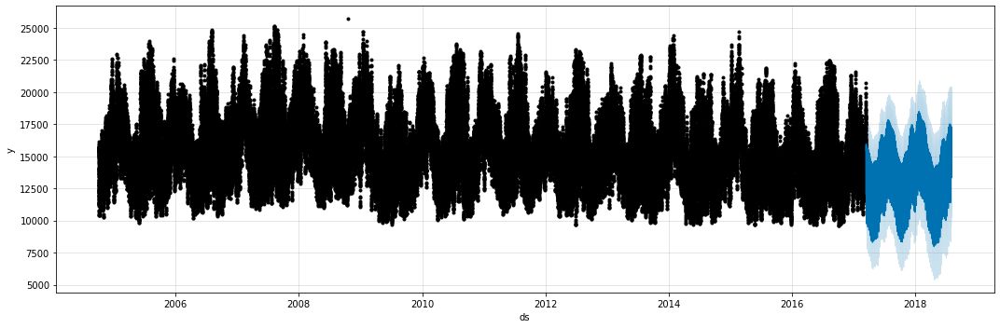

In [30]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = prophet_model.plot(test_forecast,ax=ax)
plt.show()

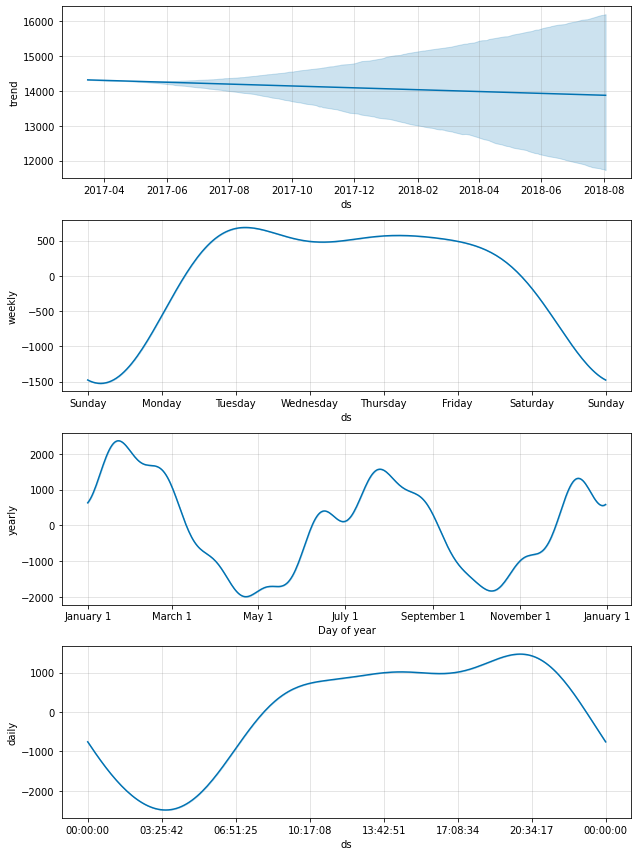

In [31]:
prophet_model.plot_components(test_forecast)
plt.show()

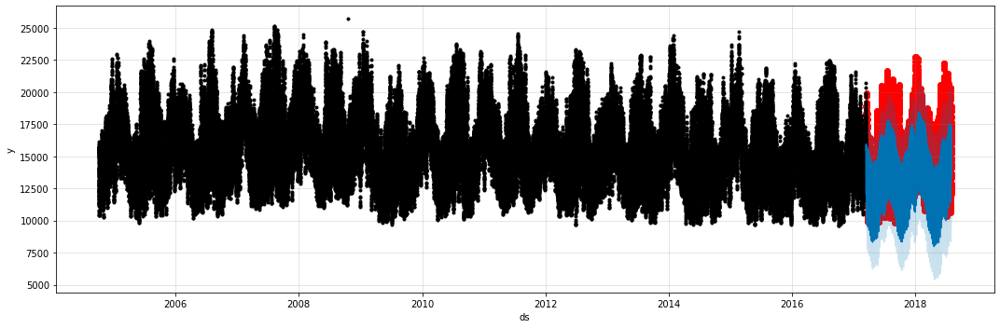

In [32]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(test.ds, test['y'], color='r')
fig = prophet_model.plot(test_forecast, ax=ax)

In [33]:
future = prophet_model.make_future_dataframe(periods=500, freq='D')
forecast_future = prophet_model.predict(future)
forecast_future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2004-10-01 01:00:00,12695.433073,10691.700235,14775.076405
1,2004-10-01 02:00:00,12105.887634,10146.550198,14095.595122
2,2004-10-01 03:00:00,11762.624961,9879.030305,13691.927325
3,2004-10-01 04:00:00,11714.955351,9714.934823,13568.245098
4,2004-10-01 05:00:00,11996.634345,9967.231392,13944.282530


In [34]:
forecast_future[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
109637,2018-07-24 16:00:00,16992.738990,13914.973269,19684.885509
109638,2018-07-25 16:00:00,16962.593331,14037.863028,19946.633168
109639,2018-07-26 16:00:00,16971.623049,13833.247985,19855.772975
109640,2018-07-27 16:00:00,16598.216374,13368.307087,19502.161186
109641,2018-07-28 16:00:00,15240.425104,12081.696083,18202.984107


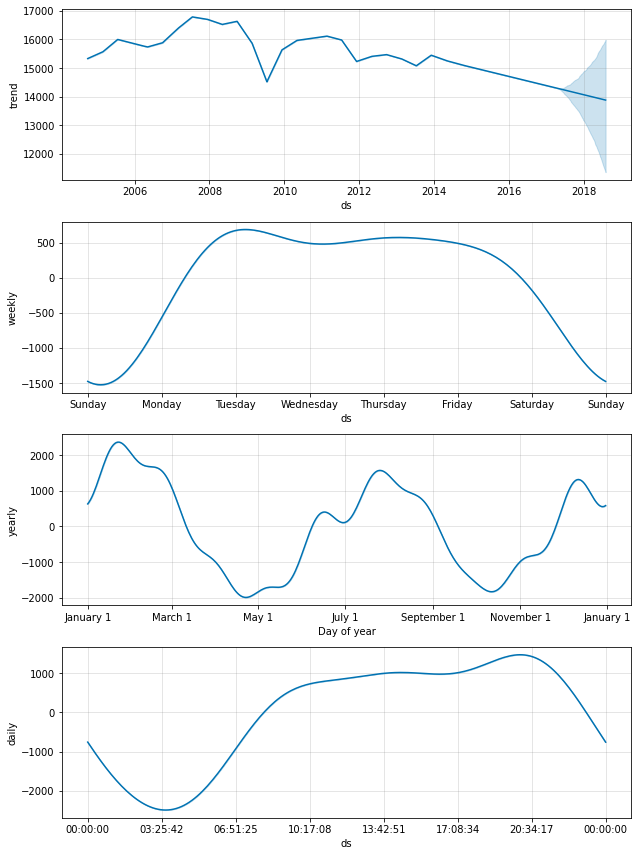

In [35]:
prophet_model.plot_components(forecast_future)
plt.show()

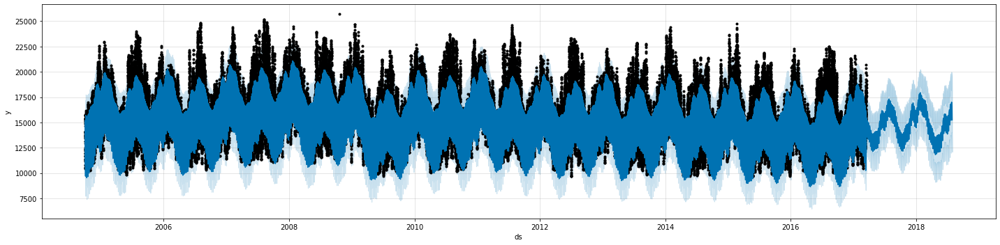

In [36]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
fig = prophet_model.plot(forecast_future,ax=ax)
plt.show()

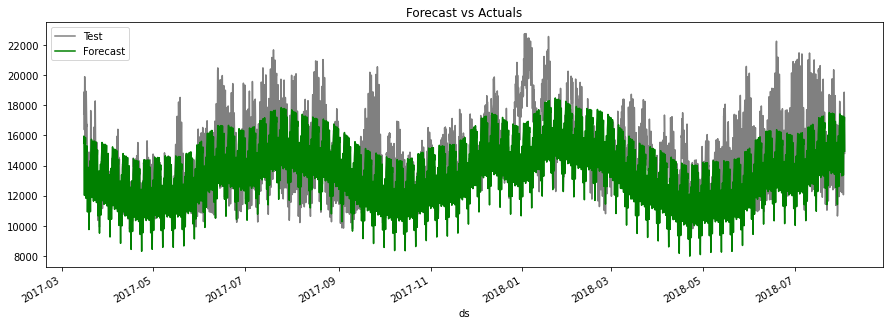

In [37]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
test.plot(kind='line',x='ds', y='y', color='gray', label='Test', ax=ax)
test_forecast.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [38]:
mape = MAPE(test['y'],test_forecast['yhat'])
print("MAPE",round(mape,4))

MAPE 9.1401


# Modeling with considering holidays

In [39]:
holiday = pd.DataFrame([])
for date, name in sorted(holidays.UnitedStates(years=[2004,2005,2006,2007,2008,
                                                      2009,2010,2011,2012,2013,2014, 
                                                      2015, 2016, 2017, 2018]).items()):
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': "US-Holidays"}, index=[0]), ignore_index=True)
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')

In [40]:
holiday.head()

,ds,holiday
0,2004-01-01,US-Holidays
1,2004-01-19,US-Holidays
2,2004-02-16,US-Holidays
3,2004-05-31,US-Holidays
4,2004-07-04,US-Holidays


In [41]:
prophet_model_with_holidays = Prophet(holidays=holiday)
prophet_model_with_holidays.fit(train)

Initial log joint probability = -880.882


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        250785     0.0134889       9399.97           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        251072    0.00670105       4322.33      0.8244      0.8244      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        251165    0.00213531       2750.41           1           1      353   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        251254    0.00037395       2735.06       0.764       0.764      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        251456    0.00121183       4120.86           1           1      578   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599     

In [42]:
future = prophet_model_with_holidays.make_future_dataframe(periods=500, freq='D')
forecast = prophet_model_with_holidays.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
109637,2018-07-24 16:00:00,17008.844983,13581.045580,20251.713414
109638,2018-07-25 16:00:00,16992.308358,13806.625229,20151.184383
109639,2018-07-26 16:00:00,17005.486607,13502.496473,20172.225922
109640,2018-07-27 16:00:00,16630.638601,13295.435607,19948.676409
109641,2018-07-28 16:00:00,15245.707843,11802.854594,18605.185616


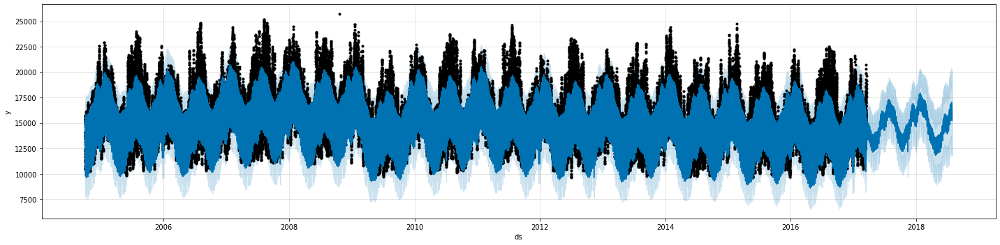

In [43]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(20)
fig = prophet_model_with_holidays.plot(forecast,ax=ax)
plt.show()

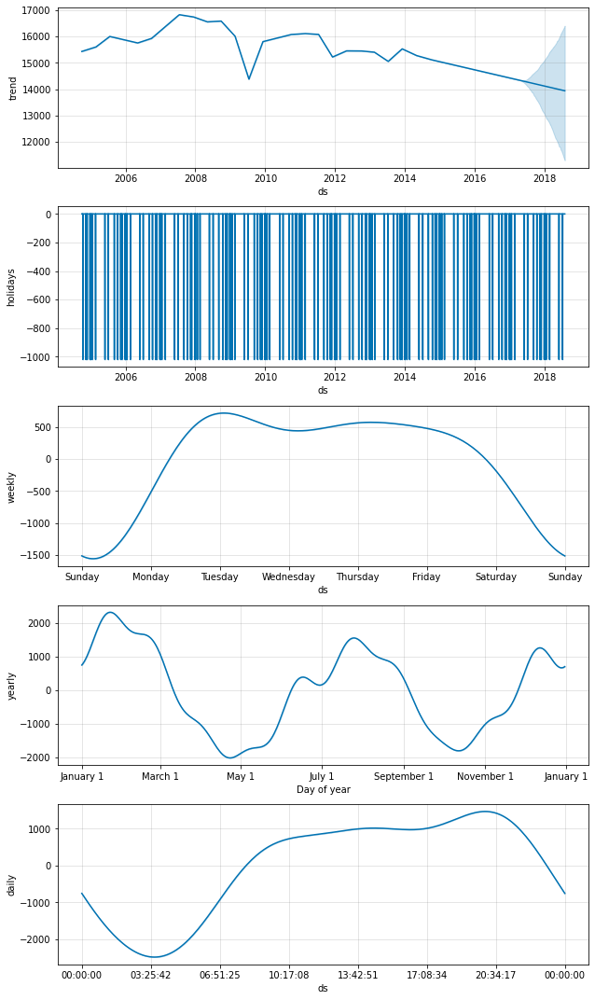

In [44]:
fig = prophet_model_with_holidays.plot_components(forecast)

In [45]:
test_forecast_holiday = prophet_model_with_holidays.predict(test)
test_forecast_holiday[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
12123,2018-08-02 20:00:00,17235.559920,14177.908526,20537.934202
12124,2018-08-02 21:00:00,17080.080148,13852.196003,20354.702429
12125,2018-08-02 22:00:00,16582.529193,13657.158069,20007.883071
12126,2018-08-02 23:00:00,15820.630885,12686.416730,18999.701065
12127,2018-08-03 00:00:00,14967.306072,11770.151230,18270.461381


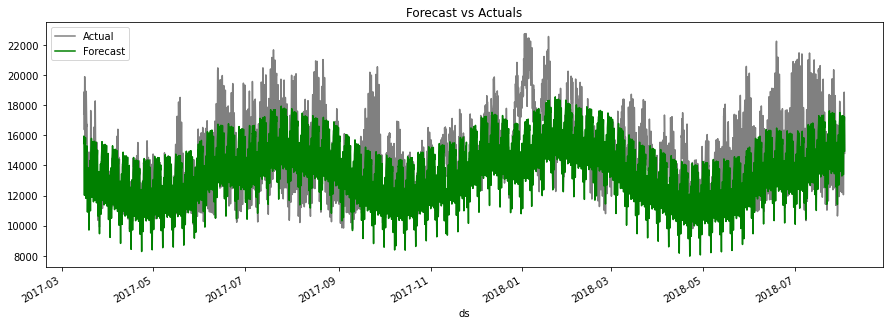

In [46]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
test.plot(kind='line',x='ds', y='y', color='gray', label='Actual', ax=ax)
test_forecast_holiday.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [47]:
mape = MAPE(test['y'],test_forecast_holiday['yhat'])
print("MAPE",round(mape,4))

MAPE 9.109


# References:
* https://facebook.github.io/prophet/docs/quick_start.html
* https://machinelearningmastery.com/time-series-forecasting-with-prophet-in-python/
* https://www.kaggle.com/robikscube/starter-hourly-energy-consumption
* https://www.kaggle.com/tarunpaparaju/m5-competition-eda-models/notebook#EDA-
* https://www.kaggle.com/mayer79/m5-forecast-keras-with-categorical-embeddings-v2
* https://www.kaggle.com/sercanyesiloz/plotly-tutorial
* https://plotly.com/python/time-series/

<div style="border-radius:10px;
            background-color:#ffffff;
            border-style: solid;
            border-color: #015a2c;
            letter-spacing:0.5px;">

<center><h4 style="padding: 5px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
    Thanks for your attention and for reviewing my notebook.🙌 <br><br>Please write your comments for me.📝</h4></center>
<center><h4 style="padding: 5px 0px; color:#015a2c; font-weight: bold; font-family: Cursive">
If you liked my work and found it useful, please upvote. Thank you🙏</h4></center>
</div>